In [2]:
"""
Created on Wed Jan 10 17:13:16 2024
@author: Wu Yuxuan
"""

import os
import warnings

import scFates as scf
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import numpy as np
from matplotlib import rc_context
from matplotlib import pyplot as plt
from ridgeplot import ridgeplot

import cellrank as cr
# import scanpy as sc
import scvelo as scv

from statannotations.Annotator import Annotator

In [3]:
import matplotlib
matplotlib.matplotlib_fname()

'/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/matplotlib/mpl-data/matplotlibrc'

In [4]:
seed = 1
warnings.simplefilter(action='ignore', category=FutureWarning)
# info
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(vector_friendly=True, dpi_save=1200) 
sc.logging.print_header()

scanpy==0.1.dev3254+g5b9bc72 anndata==0.10.3 umap==0.5.5 numpy==1.26.0 scipy==1.11.3 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.14.0 igraph==0.10.8 louvain==0.8.1 pynndescent==0.5.11


In [5]:
os.chdir('/home/wu/datb1/reseq_ppp/Pub_PPP_code')

In [6]:
sns.set_style("white")

In [7]:
adata_ker = ad.read_h5ad('/home/wu/datb1/reseq_ppp/processed_data/KC_PPP_10X.h5ad')

In [8]:
adata_ker.obs['batch_group'] = adata_ker.obs.batch_group.cat.reorder_categories(['HC', 'NL', 'Lesion'])
adata_ker.uns['batch_group_colors'] = ['#3182bd', '#31a354', '#fd8d3c']

df_name = adata_ker.obs['batch'].astype(str).str.split("_", expand=True)
df_name.loc[df_name.index.str.contains('PPP'), 1] = df_name.loc[df_name.index.str.contains('PPP'), 1].str.split("C", expand=True)[0]
df_name = df_name[0] + '_' + df_name[1]
# df_name.str.split("C", expand=True)[0]
# df_name[df_name.index.str.contains('PPP_')] = df_name[df_name.index.str.contains('PPP')].str.split("C", expand=True)[0]
adata_ker.obs['patient'] = df_name.copy()
adata_ker.obs['patient'].value_counts()

adata_ker.obs['leiden'] = adata_ker.obs['leiden'].cat.reorder_categories(['Basal KC I', 'Basal KC II', 'Basal KC III', 'Suprabasal KC I', 
                                            'Suprabasal KC II', 'Proliferating KC', 'Stressed KC'])

### CytoTrace

In [9]:
adata_ker.layers["spliced"] = adata_ker.raw.X.copy()
adata_ker.layers["unspliced"] = adata_ker.raw.X.copy()
sc.pp.pca(adata_ker)
sc.pp.neighbors(adata_ker, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata_ker, n_pcs=30, n_neighbors=30)

from cellrank.kernels import CytoTRACEKernel

ctk = CytoTRACEKernel(adata_ker).compute_cytotrace()

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:15)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing moments based on connectivities
    finished (0:00:23) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [10]:
sample_list = adata_ker.obs.leiden.cat.categories

fig = ridgeplot(
    samples=[adata_ker.obs.loc[adata_ker.obs.leiden == sample, 'ct_pseudotime'] for sample in sample_list],
    labels=sample_list,
    colorscale='ylgnbu',
    colormode='mean-means',
    coloralpha=0.8,
)

fig.update_layout(
    title="CytoTRACE pseudotime",
    height=500,
    width=750,
    font_size=14,
    plot_bgcolor="white",
    xaxis_gridcolor="rgb(211,211,211)",
    yaxis_gridcolor="white",
    xaxis_gridwidth=1,
    yaxis_title="Cluster",
    xaxis_title="CytoTRACE pseudotime",
    showlegend=True,
)
# fig.show()
fig.write_image('figures/fig2_3/kc_PPP_CytoTRACE_pseudotime.pdf')

In [11]:
fig.show()

### traj analysis

Standardizing Data across genes.

Found 16 batches

Found 0 numerical variables:
	

Found 124 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:31)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



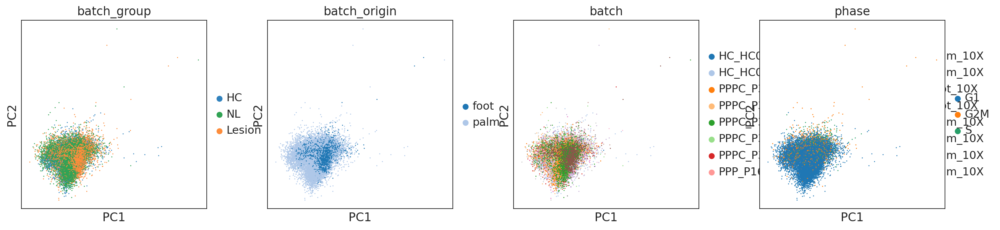

In [12]:
adata_ker_traj = adata_ker[adata_ker.obs['leiden'].isin(['Basal KC I', 'Basal KC II', 'Basal KC III', 'Suprabasal KC I', 'Suprabasal KC II'])].copy()
adata_ker_traj = adata_ker_traj.raw.to_adata().copy()

adata_ker_traj.raw = adata_ker_traj

sc.pp.combat(adata_ker_traj, key='batch')
sc.pp.regress_out(adata_ker_traj, ['total_counts', 'pct_counts_mt'], n_jobs=4, add_intercept=True)
sc.pp.highly_variable_genes(adata_ker_traj, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pp.scale(adata_ker_traj, max_value=10)
sc.pp.neighbors(adata_ker_traj, n_neighbors=10, n_pcs=20)
sc.pl.pca(adata_ker_traj, color=['batch_group', 'batch_origin', 'batch', 'phase'])

In [13]:
sc.tl.diffmap(adata_ker_traj)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98519945 0.9659389  0.96471286 0.9594558  0.9558778
     0.9548841  0.9481563  0.94086456 0.93860716 0.93332934 0.9325803
     0.92934334 0.9253583  0.9240039 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:02)


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



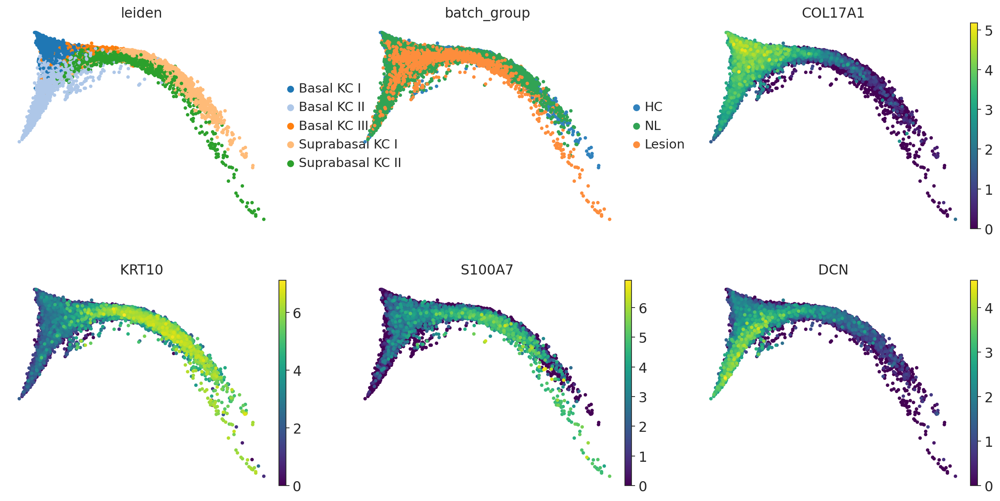

In [14]:
with rc_context({"figure.figsize": (5, 4)}):
    sc.pl.diffmap(adata_ker_traj, color=['leiden', 'batch_group', 'COL17A1', 'KRT10', 'S100A7', 'DCN'], frameon=False, cmap='viridis', show=False, components=['2,3'], ncols=3, size = 50)
    plt.savefig('figures/fig2_3/kc_PPP_diffmap_marker.pdf')

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



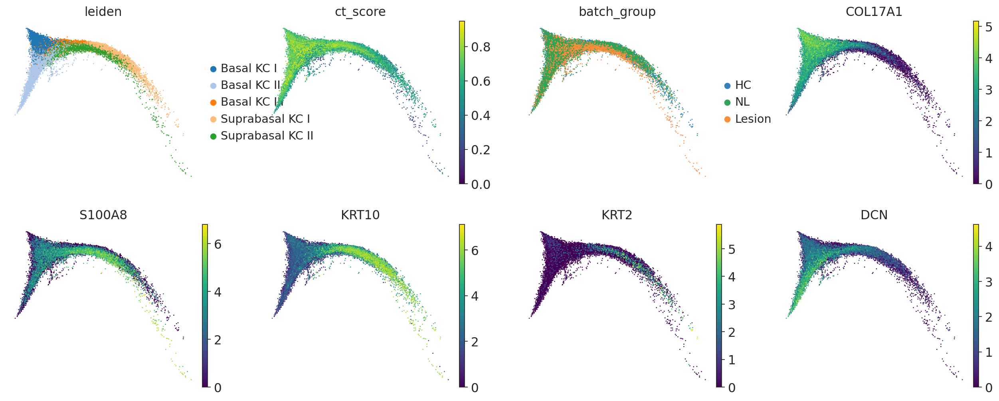

In [15]:
with rc_context({"figure.figsize": (4, 3.5)}):
    sc.pl.diffmap(adata_ker_traj, color=['leiden', 'ct_score', 'batch_group', 'COL17A1', 'S100A8', 'KRT10', 'KRT2', 'DCN'], frameon=False, cmap='viridis', show=False, components=['2,3'])
    # plt.savefig('figures/fig2_3/kc_PPP_diffmap_marker.pdf')

In [16]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata_ker_traj.obsm["X_diffmap2d"]=adata_ker_traj.obsm["X_diffmap"][:,1:3]

inferring a principal curve --> parameters used 
    30 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:05) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



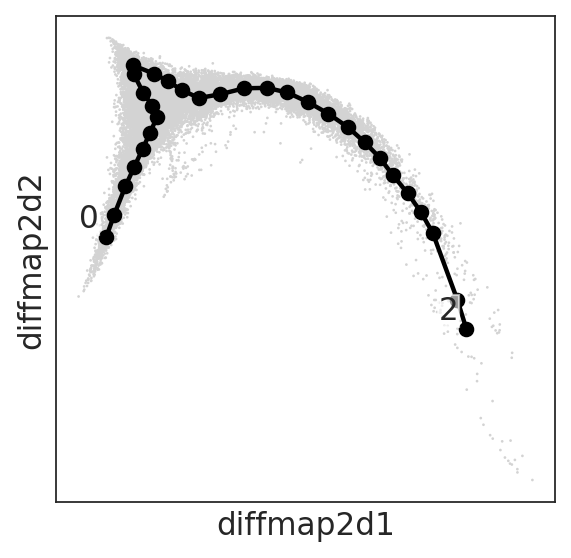

automatic root selection using COL17A1 values
node 12 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    mappings: 100%|██████████| 100/100 [01:46<00:00,  1.07s/it]
    finished (0:01:51) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


In [17]:
scf.tl.curve(adata_ker_traj,Nodes=30,use_rep="X_diffmap2d",ndims_rep=2,)
scf.pl.graph(adata_ker_traj,basis="diffmap2d")
scf.tl.root(adata_ker_traj,"COL17A1") # use COL17A1 as root
scf.tl.pseudotime(adata_ker_traj,n_jobs=20,n_map=100,seed=42)

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



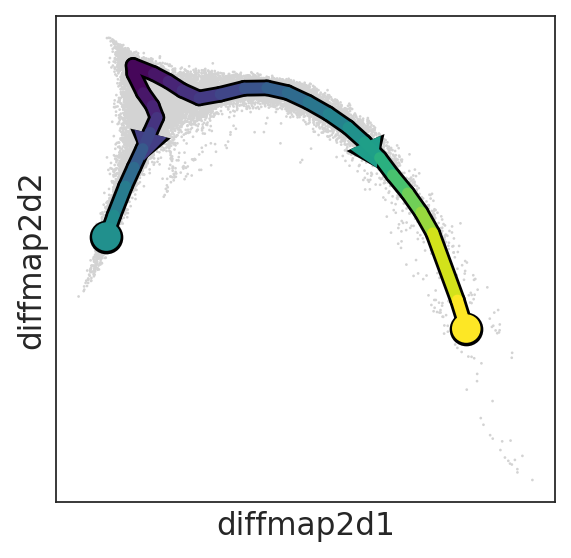

In [18]:
scf.pl.trajectory(adata_ker_traj,basis="diffmap2d",arrows=True,arrow_offset=3)

### Using pseudotime to fit Markov chain

In [19]:
pk = cr.kernels.PseudotimeKernel(adata_ker_traj, time_key="t")
pk.compute_transition_matrix()

  0%|          | 0/20358 [00:00<?, ?cell/s]

PseudotimeKernel[n=20358, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [20]:
g = cr.estimators.GPCCA(pk)
print(g)

GPCCA[kernel=PseudotimeKernel[n=20358], initial_states=None, terminal_states=None]


In [21]:
g.fit(cluster_key="leiden", n_states=9)

GPCCA[kernel=PseudotimeKernel[n=20358], initial_states=None, terminal_states=None]

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/utils.py:1391: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/utils.py:1392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



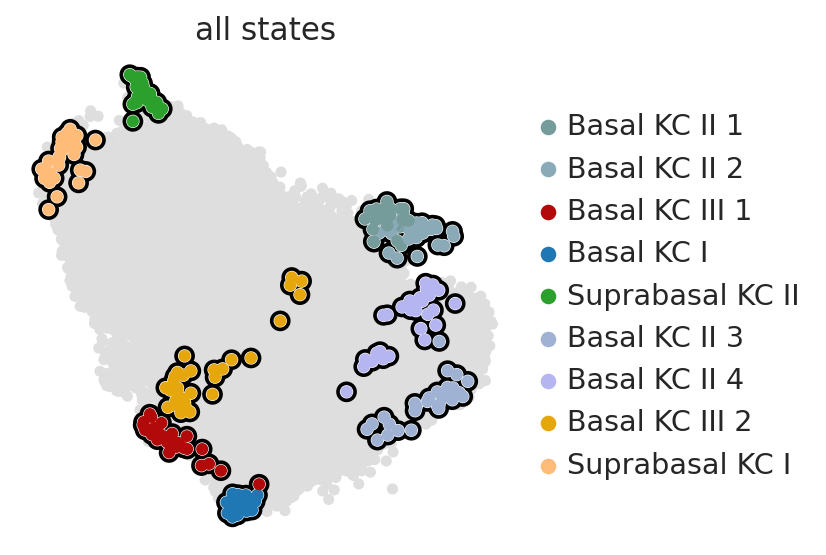

In [22]:
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

In [23]:
g.set_terminal_states(states=['Suprabasal KC I', 'Suprabasal KC II', 'Basal KC II_3'])

GPCCA[kernel=PseudotimeKernel[n=20358], initial_states=None, terminal_states=['Basal KC II_3', 'Suprabasal KC I', 'Suprabasal KC II']]

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/utils.py:1391: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/scvelo/plotting/utils.py:1392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



saving figure to file figures/fig2_3/kc_PPP_diffmap_terminal_states.pdf


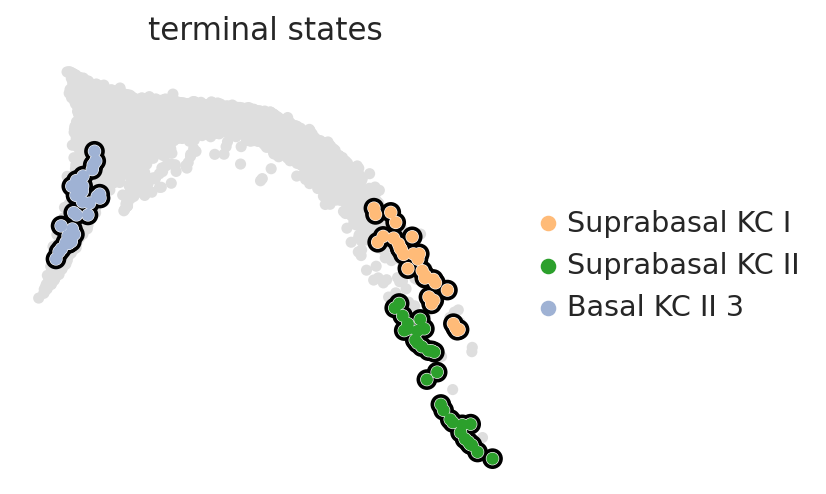

In [24]:
with rc_context({"figure.figsize": (4, 3.5)}):
    g.plot_macrostates(which="terminal", legend_loc="right", size=100, discrete=True, basis="diffmap", save="figures/fig2_3/kc_PPP_diffmap_terminal_states.pdf")
    # plt.savefig('figures/fig2_3/kc_PPP_diffmap_terminal_states.pdf')

In [25]:
g.compute_fate_probabilities()

  0%|          | 0/3 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


saving figure to file figures/fig2_3/kc_PPP_diffmap_fate_probabilities.pdf


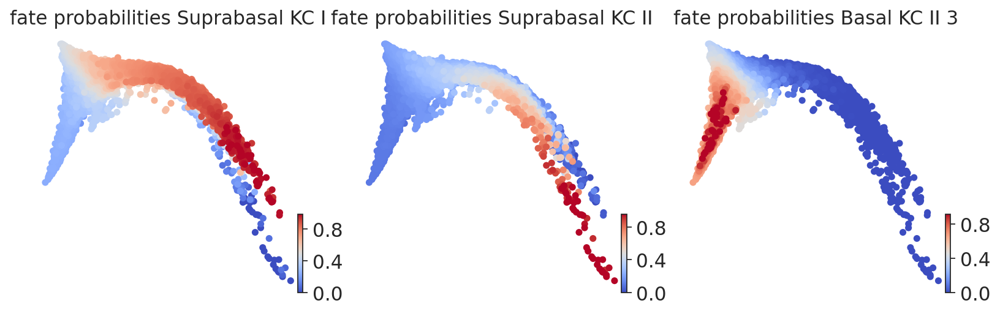

In [26]:
with rc_context({"figure.figsize": (4, 3.5)}):
    g.plot_fate_probabilities(same_plot=False, basis="diffmap", cmap="coolwarm", legend_loc="right", size=100, save="figures/fig2_3/kc_PPP_diffmap_fate_probabilities.pdf")
    # plt.savefig('figures/fig2_3/kc_PPP_diffmap_fate_probabilities.pdf')

### Test gene association

In [27]:
# 'Suprabasal KC I', 'Suprabasal KC II_2', 'Basal KC II_1'
driver_df_lesion = g.compute_lineage_drivers('Suprabasal KC II')
driver_df_control = g.compute_lineage_drivers('Suprabasal KC I')
driver_df_basal = g.compute_lineage_drivers('Basal KC II_3')

In [28]:
model = cr.models.GAM(adata_ker_traj, distribution='gaussian', link='identity')

  0%|          | 0/11 [00:00<?, ?gene/s]

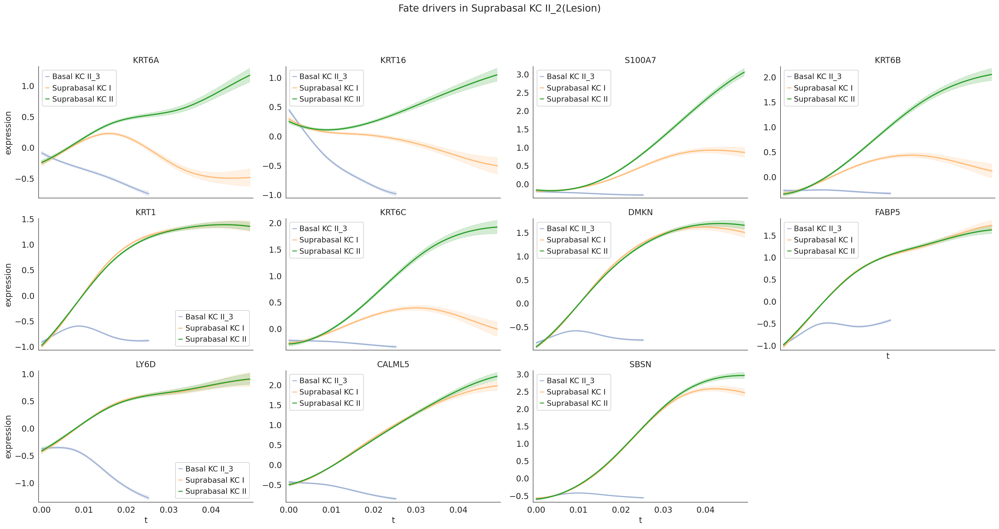

In [29]:
with rc_context({"figure.figsize": (4, 3.5)}):
    _g = cr.pl.gene_trends(
        adata_ker_traj,
        model=model,
        genes=['KRT6A', 'KRT16', 'S100A7', 'KRT6B'] + driver_df_lesion.index.tolist()[:10],
        same_plot=True,
        ncols=4,
        time_key="t",
        hide_cells=True,
        weight_threshold=(1e-3, 1e-3),
        return_figure=True,
        suptitle="Fate drivers in Suprabasal KC II_2(Lesion)",
    )
    sns.despine()
    plt.savefig('figures/fig2_3/kc_PPP_diffmap_fate_genes_lesion.pdf')

  0%|          | 0/10 [00:00<?, ?gene/s]

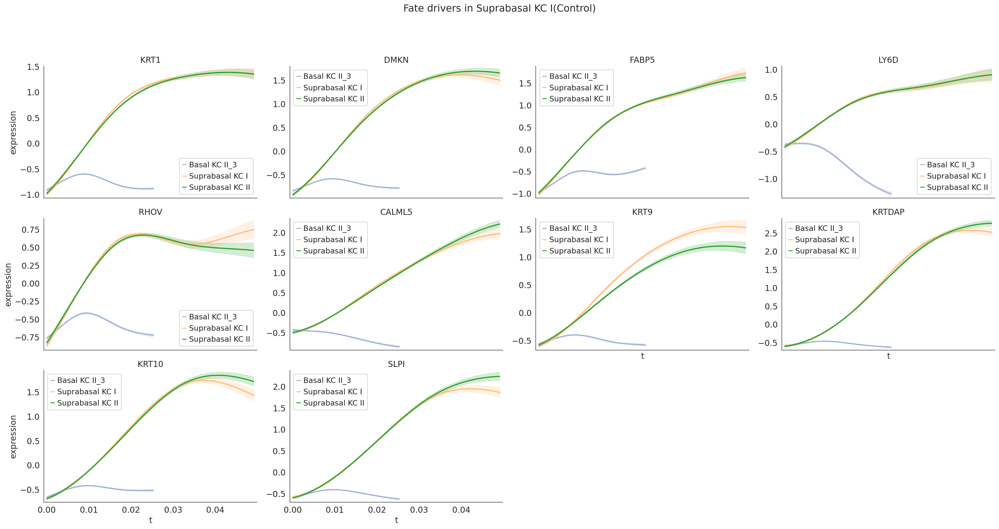

In [30]:
with rc_context({"figure.figsize": (4, 3.5)}):
    _g = cr.pl.gene_trends(
        adata_ker_traj,
        model=model,
        genes=list(driver_df_control.index[:10]),
        same_plot=True,
        ncols=4,
        time_key="t",
        hide_cells=True,
        weight_threshold=(1e-3, 1e-3),
        return_figure=True,
        suptitle="Fate drivers in Suprabasal KC I(Control)",
    )
    sns.despine()
    plt.savefig('figures/fig2_3/kc_PPP_diffmap_fate_genes_control.pdf')

  0%|          | 0/20 [00:00<?, ?gene/s]

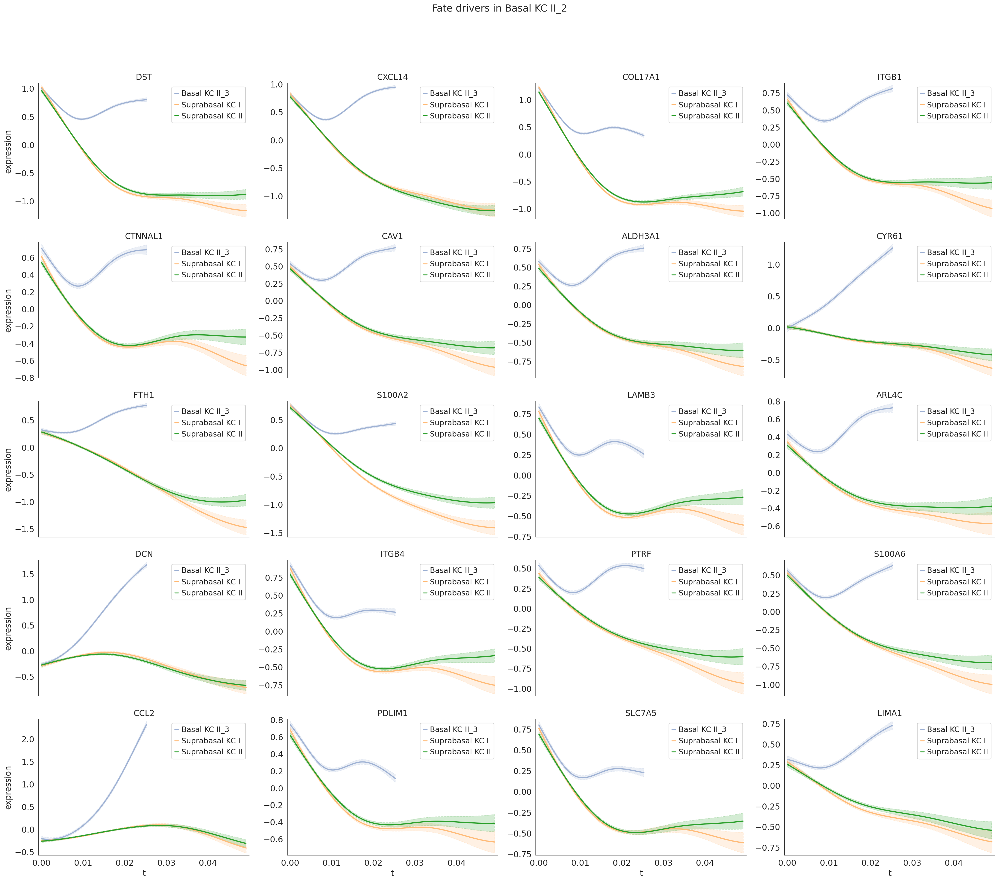

In [31]:
with rc_context({"figure.figsize": (4, 3.5)}):
    _g = cr.pl.gene_trends(
        adata_ker_traj,
        model=model,
        genes=driver_df_basal.index[:20],
        same_plot=True,
        ncols=4,
        time_key="t",
        hide_cells=True,
        weight_threshold=(1e-3, 1e-3),
        return_figure=True,
        suptitle="Fate drivers in Basal KC II_2",
    )
    sns.despine()
    plt.savefig('figures/fig2_3/kc_PPP_diffmap_fate_genes_basal.pdf')